Import libraries and packages:

In [38]:
!pip install tensorflow_addons

import numpy as np
import tensorflow as tf
import requests
import json
import shutil
import datetime
import os,glob
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as  sns
from sklearn.metrics import confusion_matrix

from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.95
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow_addons as tfa
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.python.client import  device_lib
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input

Download images .zip from repository:

In [ ]:
ct_images_dir = 'ct-images'
!rm -r ct-images
os.makedirs(ct_images_dir)

# Download url of non-COVID CT scans.
!wget --no-check-certificate https://github.com/deborawendland/cnn-covid-ct-images/raw/main/data/CT_COVID.zip -O covid.zip
!wget --no-check-certificate https://github.com/deborawendland/cnn-covid-ct-images/raw/main/data/CT_NonCOVID.zip -O noncovid.zip

!unzip covid.zip -d  ./ct-images && mv ./ct-images/CT_COVID/ ./ct-images/covid
!unzip noncovid.zip -d  ./ct-images && mv ./ct-images/CT_NonCOVID/ ./ct-images/noncovid

!rm *.zip

Split the files into two groups: train, validation and test:





In [45]:
!rm -r data-split/

data_split_dir = 'data-split'
os.makedirs(data_split_dir)

url = 'https://github.com/deborawendland/cnn-covid-ct-images/raw/main/data/data_split/'

files = {
    'train': [
        'trainCT_COVID.txt',
        'trainCT_NonCOVID.txt'
    ],
    'validation': [
        'valCT_COVID.txt',
        'valCT_NonCOVID.txt'
    ], 
    'test': [
        'testCT_COVID.txt',
        'testCT_NonCOVID.txt' 
    ]
}

for stage in files:
  count = 0
  for file in files[stage]:
    request_url = url + file
    r = requests.get(request_url)
    open('./{dir}/{file}'.format(dir=data_split_dir, file=file), 'wb').write(r.content)
    count = count + len(open('./{dir}/{file}'.format(dir=data_split_dir, file=file), 'r').readlines())
  print ('{}: {}'.format(stage, count))

total = 0
for stage in fil:
  for file in fil[stage]:
      total = total + len(open('./{dir}/{file}'.format(dir=data_split_dir, file=file), 'r').readlines())
print ('total: {}'.format(total))

train: 425
validation: 118
test: 203
total: 746


* Separates files into train, validation and test folders

In [47]:
!rm -r ./ct-images/train
!rm -r ./ct-images/validate
!rm -r ./ct-images/test
!rm data.json

data = {
    'train': {
        'covid': [],
        'noncovid': []
    }, 
    'validation': {
        'covid': [],
        'noncovid': []
    },
    'test': {
        'covid': [],
        'noncovid': []
    }
}

for stage in files: 
  for file in files[stage]:
    content = open('./{dir}/{file}'.format(dir=data_split_dir, file=file), 'r').readlines()
    if 'NonCOVID' in file:
      for line in content:
        data[stage]['noncovid'].append(line.replace('\n', ''))
    else:
      for line in content:
        data[stage]['covid'].append(line.replace('\n', ''))

with open("data.json", "w") as txt_file:
  json.dump(data, txt_file)
  

for stage in data:
  for case in data[stage]:
    try:
      os.makedirs('{dir}/{stage}/{case}'.format(dir=ct_images_dir,
                                                stage=stage,
                                                case=case))
    except:
      pass
    for file in data[stage][case]:
      shutil.move('{dir}/{case}/{file}'.format(dir=ct_images_dir,
                                               case=case,
                                               file=file), 
                  '{dir}/{stage}/{case}/{file}'.format(dir=ct_images_dir,
                                                       stage=stage,
                                                       case=case,
                                                       file=file))
      
        
!rm -r ./ct-images/covid
!rm -r ./ct-images/noncovid

rm: cannot remove './ct-images/train': No such file or directory
rm: cannot remove './ct-images/validate': No such file or directory
rm: cannot remove './ct-images/test': No such file or directory
rm: cannot remove 'data.json': No such file or directory


Import train, validation and test info:

In [48]:
with open('data.json') as json_file:
    data = json.load(json_file)

for stage in data:
  for case in data[stage]:
    print ('Total images: {stage} - {case}: {count}'.format(stage=stage,
                                                            case=case,
                                                            count=len(data[stage][case])))

Total images: train - covid: 191
Total images: train - noncovid: 234
Total images: validation - covid: 60
Total images: validation - noncovid: 58
Total images: test - covid: 98
Total images: test - noncovid: 105


Preprocessing stage:

In [79]:
train_datagen = ImageDataGenerator(rescale=1/255) 
validation_datagen = ImageDataGenerator(rescale=1/255)

train = train_datagen.flow_from_directory(
        './ct-images/train/',
        target_size=(227, 227), 
        class_mode='categorical')

validation = validation_datagen.flow_from_directory(
        './ct-images/validation/', 
        target_size=(227, 227), 
        class_mode='categorical')

Found 425 images belonging to 2 classes.
Found 118 images belonging to 2 classes.


In [80]:
print("Batch Size for Input Image : ",train[0][0].shape)
print("Batch Size for Output Image : ",train[0][1].shape)
print("Image Size of first image : ",train[0][0][0].shape)
print("Output of first image : ",train[0][1][0].shape)

Batch Size for Input Image :  (32, 227, 227, 3)
Batch Size for Output Image :  (32, 2)
Image Size of first image :  (227, 227, 3)
Output of first image :  (2,)


/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


Text(0.5, 1.0, '[1. 0.]')

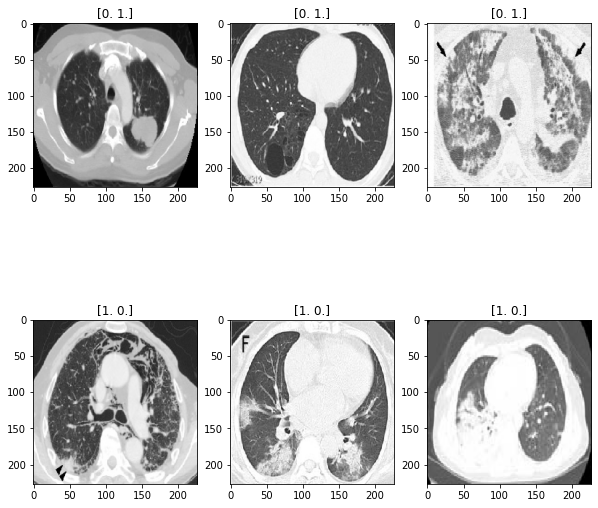

In [81]:
fig , axs = plt.subplots(2,3 ,figsize = (10,10))
axs[0][0].imshow(train[0][0][8])
axs[0][0].set_title(train[0][1][8])
axs[0][1].imshow(train[0][0][10])
axs[0][1].set_title(train[0][1][10])
axs[0][2].imshow(train[0][0][5])
axs[0][2].set_title(train[0][1][5])
axs[1][0].imshow(train[0][0][2])
axs[1][0].set_title(train[0][1][0])
axs[1][1].imshow(train[0][0][7])
axs[1][1].set_title(train[0][1][7])
axs[1][2].imshow(train[0][0][3])
axs[1][2].set_title(train[0][1][3])

* Flattening
* Activation Function - Sigmoide

In [104]:
def AlexNet( input_shape, num_classes):
    initializer = tf.keras.initializers.GlorotNormal()
    model = tf.keras.Sequential(name='AlexNet')
    model.add(Conv2D(32, kernel_size=(11,11), strides= 4,
                    padding= 'valid', activation= 'relu',
                    input_shape= input_shape, kernel_initializer= initializer))
    model.add(MaxPooling2D(pool_size=(3,3), strides= (2,2),
                          padding= 'valid', data_format= None))
    model.add(Conv2D(64, kernel_size=(3,3), strides= 1,
                    padding= 'same', activation= 'relu',
                    kernel_initializer= initializer))

    model.add(MaxPooling2D(pool_size=(3,3), strides= (2,2),
                          padding= 'valid', data_format= None))

    model.add(Flatten())
    model.add(Dense(128, activation=tf.nn.sigmoid))
    model.add(Dense(num_classes, activation= 'softmax'))

    model.compile(optimizer = tf.optimizers.Adam(),
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])
    return model


def train_model(model,valid_generator,train_generator,EPOCHS):   
    history=model.fit(train_generator,
                    epochs=EPOCHS,
                    validation_data=valid_generator,
                    verbose=1)
    return history

num_classes= len(np.unique(train.classes))
model = AlexNet((227, 227, 3), num_classes)
model.summary()

history=train_model(model,validation,train,30)

Model: "AlexNet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_75 (Conv2D)           (None, 55, 55, 32)        11648     
_________________________________________________________________
max_pooling2d_71 (MaxPooling (None, 27, 27, 32)        0         
_________________________________________________________________
conv2d_76 (Conv2D)           (None, 27, 27, 64)        18496     
_________________________________________________________________
max_pooling2d_72 (MaxPooling (None, 13, 13, 64)        0         
_________________________________________________________________
flatten_30 (Flatten)         (None, 10816)             0         
_________________________________________________________________
dense_74 (Dense)             (None, 128)               1384576   
_________________________________________________________________
dense_75 (Dense)             (None, 2)                 258 

In [105]:
model.evaluate(validation)

4/4 [==============================] - 1s 221ms/step - loss: 1.0005 - accuracy: 0.6949


[1.0004909038543701, 0.694915235042572]

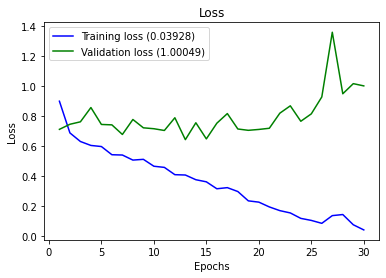

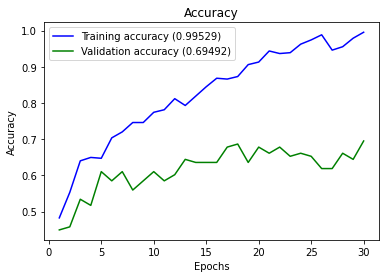

In [106]:
def plot_history(history):
    loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' not in s]
    val_loss_list = [s for s in history.history.keys() if 'loss' in s and 'val' in s]
    acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' not in s]
    val_acc_list = [s for s in history.history.keys() if 'acc' in s and 'val' in s]
    
    if len(loss_list) == 0:
        print('Loss is missing in history')
        return 
    
    ## As loss always exists
    epochs = range(1,len(history.history[loss_list[0]]) + 1)
    
    ## Loss
    plt.figure(1)
    for l in loss_list:
        plt.plot(epochs, history.history[l], 'b', label='Training loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    for l in val_loss_list:
        plt.plot(epochs, history.history[l], 'g', label='Validation loss (' + str(str(format(history.history[l][-1],'.5f'))+')'))
    
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    ## Accuracy
    plt.figure(2)
    for l in acc_list:
        plt.plot(epochs, history.history[l], 'b', label='Training accuracy (' + str(format(history.history[l][-1],'.5f'))+')')
    for l in val_acc_list:    
        plt.plot(epochs, history.history[l], 'g', label='Validation accuracy (' + str(format(history.history[l][-1],'.5f'))+')')

    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()


plot_history(history)


Previsao - NonCOVID

rm: cannot remove '*.jpg': No such file or directory


Saving 8.jpg to 8.jpg
Saving 849.png to 849.png
Saving 997.png to 997.png
Saving 969.png to 969.png
Saving 996.png to 996.png
Saving 9.jpg to 9.jpg
Saving 848.png to 848.png
Saving 7.jpg to 7.jpg
Saving 658.png to 658.png
Saving 592.png to 592.png
Saving 6%1.jpg to 6%1.jpg
Saving 6%0.jpg to 6%0.jpg
Saving 663.png to 663.png
Saving 5%5.jpg to 5%5.jpg
Saving 662.png to 662.png
Saving 6%2.jpg to 6%2.jpg
Saving 584.png to 584.png
Saving 5%7.jpg to 5%7.jpg
Saving 5%0.jpg to 5%0.jpg
Saving 583.png to 583.png
Saving 661.png to 661.png
Saving 452.png to 452.png
Saving 5%1.jpg to 5%1.jpg
Saving 6%3.jpg to 6%3.jpg
Saving 5%6.jpg to 5%6.jpg
Saving 591.png to 591.png
Saving 5%2.jpg to 5%2.jpg
Saving 5%4.jpg to 5%4.jpg
Saving 5%3.jpg to 5%3.jpg
Saving 590.png to 590.png
Saving 660.png to 660.png
Saving 4%1.jpg to 4%1.jpg
Saving 2108.png to 2108.png
Saving 3.jpg to 3.jpg
Saving 2237.png to 2237.png
Saving 4%5.jpg to 4%5.jpg
Saving 4%7.jpg to 4%7.jpg
Saving 4%3.jpg to 4%3.jpg
Saving 2341.png to 2341.

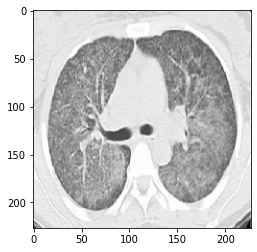

8.jpg NonCOVID


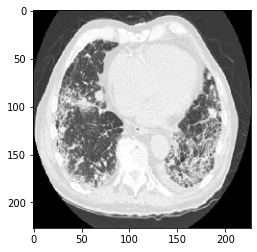

849.png NonCOVID


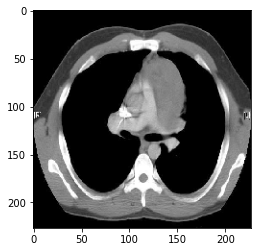

997.png NonCOVID


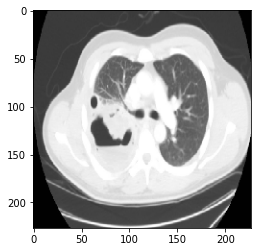

969.png COVID


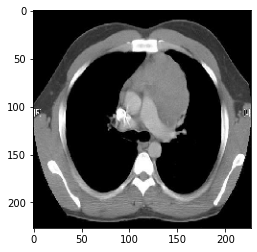

996.png NonCOVID


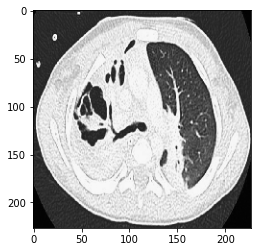

9.jpg COVID


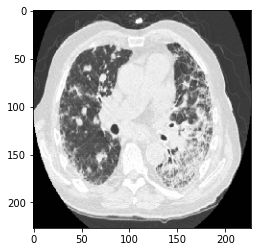

848.png COVID


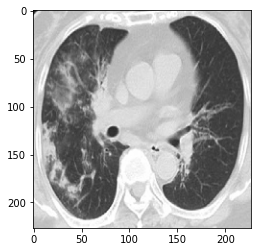

7.jpg COVID


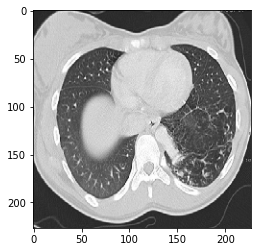

658.png NonCOVID


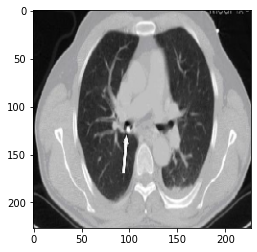

592.png NonCOVID


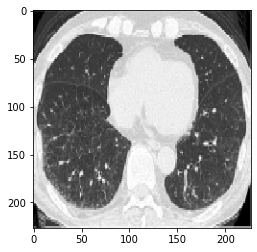

6%1.jpg NonCOVID


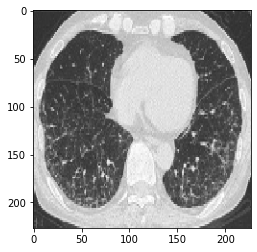

6%0.jpg NonCOVID


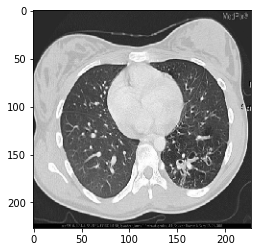

663.png NonCOVID


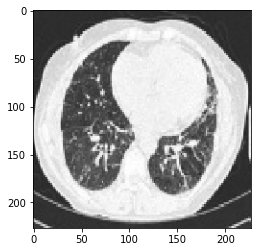

5%5.jpg NonCOVID


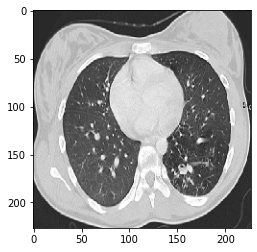

662.png COVID


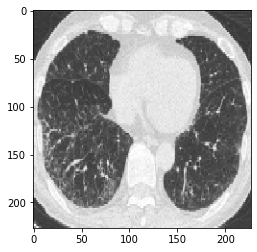

6%2.jpg NonCOVID


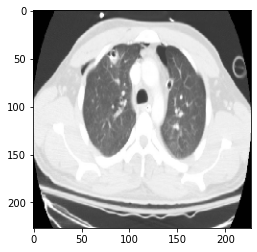

584.png COVID


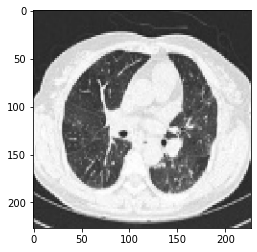

5%7.jpg NonCOVID


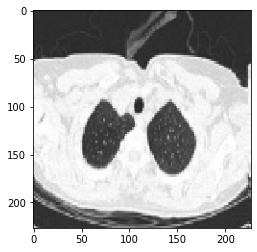

5%0.jpg COVID


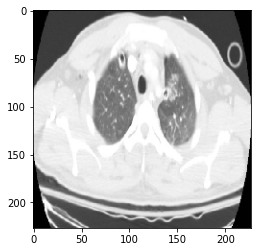

583.png COVID


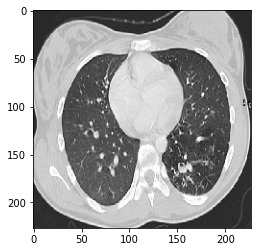

661.png COVID


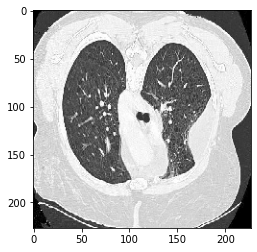

452.png COVID


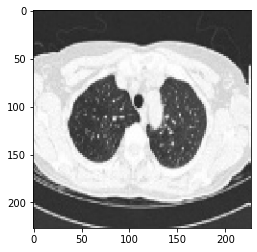

5%1.jpg COVID


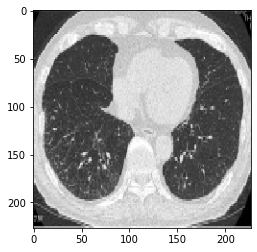

6%3.jpg NonCOVID


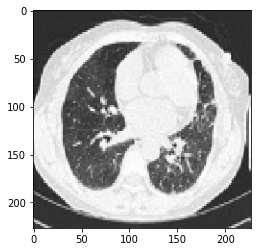

5%6.jpg COVID


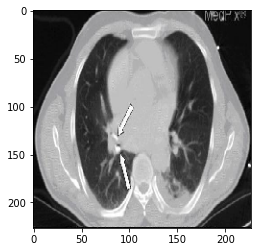

591.png NonCOVID


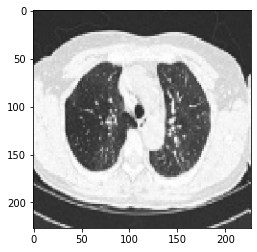

5%2.jpg NonCOVID


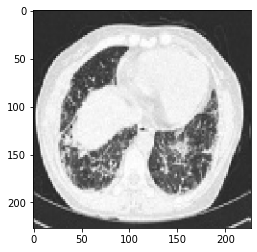

5%4.jpg NonCOVID


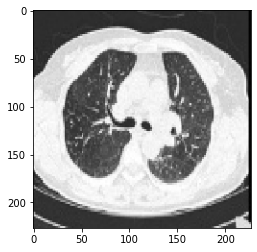

5%3.jpg NonCOVID


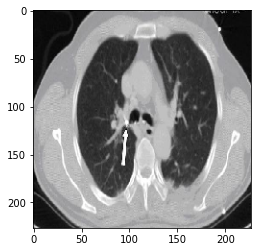

590.png NonCOVID


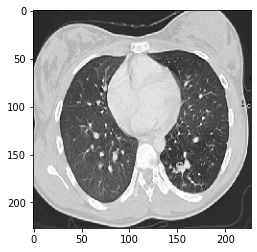

660.png NonCOVID


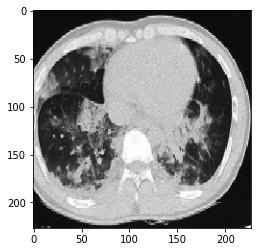

4%1.jpg NonCOVID


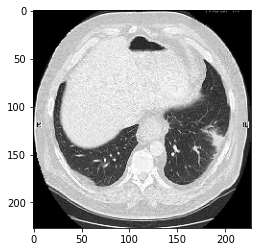

2108.png NonCOVID


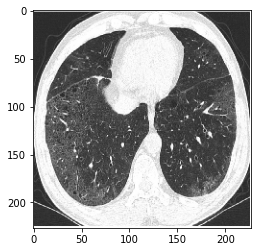

3.jpg COVID


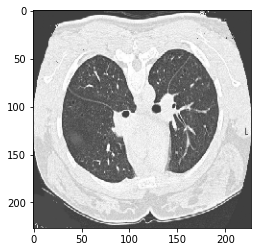

2237.png COVID


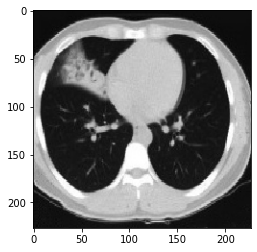

4%5.jpg NonCOVID


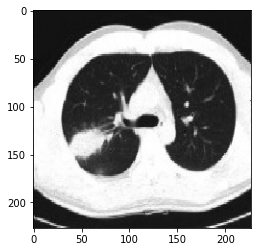

4%7.jpg NonCOVID


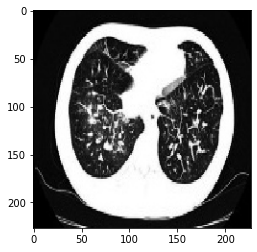

4%3.jpg NonCOVID


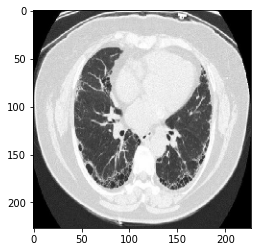

2341.png NonCOVID


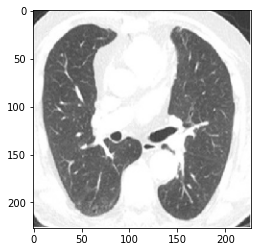

17%0.jpg COVID


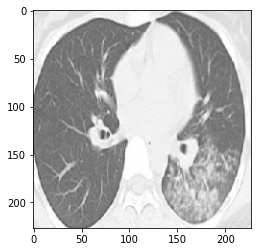

16.jpg COVID


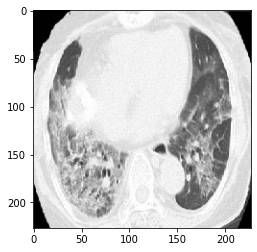

18%3.jpg NonCOVID


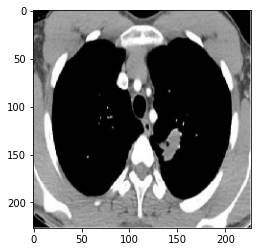

14%1.jpg COVID


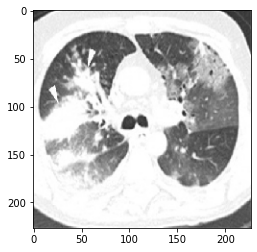

17%1.jpg COVID


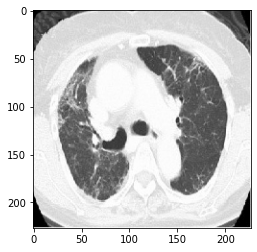

18%0.jpg NonCOVID


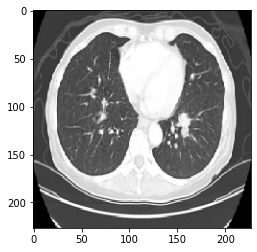

167.png NonCOVID


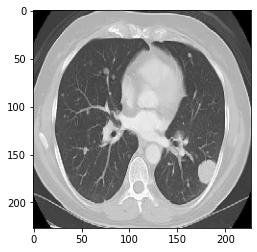

177.png NonCOVID


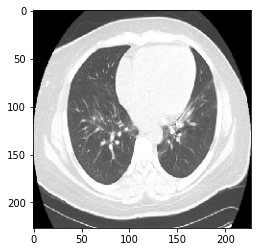

1859.png NonCOVID


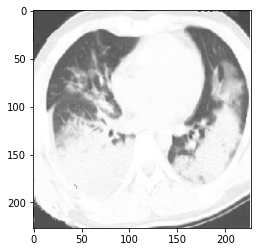

2%3.jpg COVID


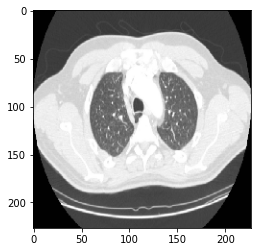

1501.png COVID


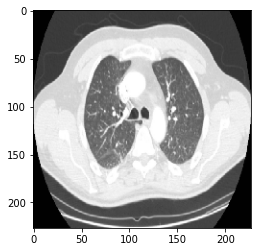

1497.png NonCOVID


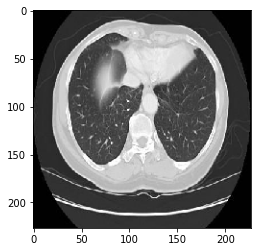

1218.png NonCOVID


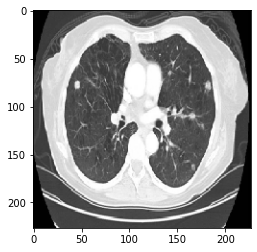

166.png NonCOVID


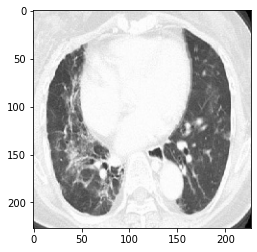

18%1.jpg NonCOVID


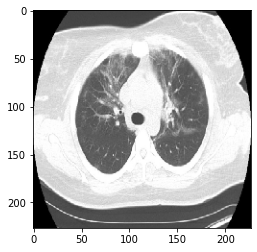

1857.png NonCOVID


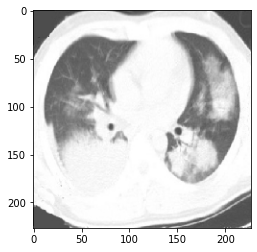

2%2.jpg COVID


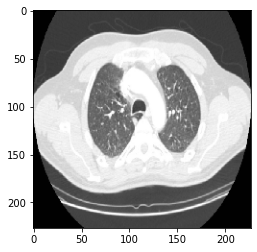

1500.png COVID


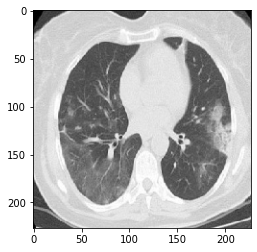

14%2.jpg COVID


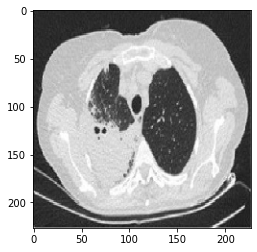

19%0.jpg NonCOVID


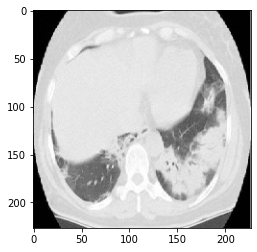

14%0.jpg NonCOVID


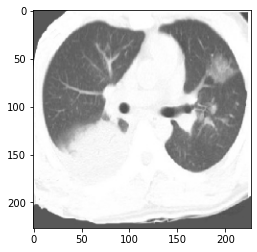

2%1.jpg COVID


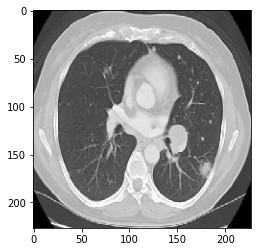

176.png NonCOVID


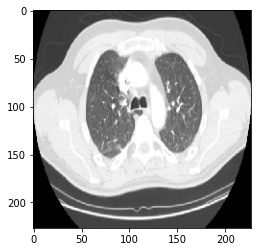

1499.png NonCOVID


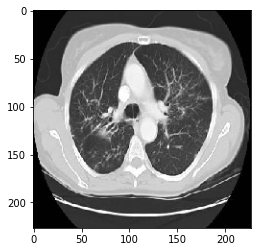

1217.png NonCOVID


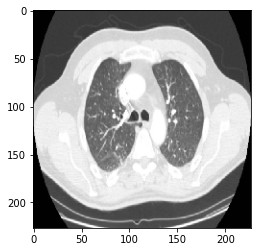

1498.png NonCOVID


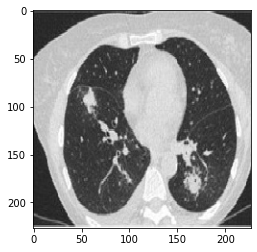

19%1.jpg COVID


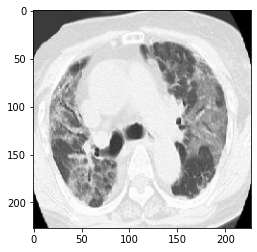

18%2.jpg NonCOVID


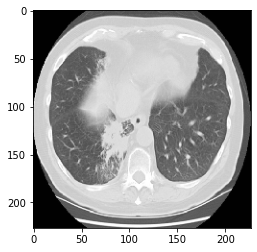

1814.png NonCOVID


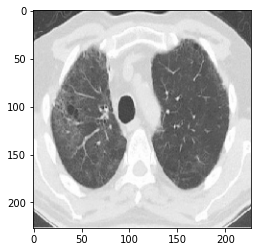

14%3.jpg NonCOVID


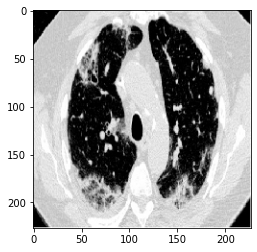

15%0.jpg COVID


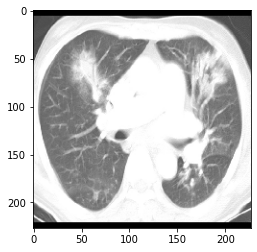

13.jpg NonCOVID


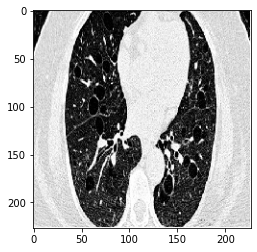

15%3.jpg COVID


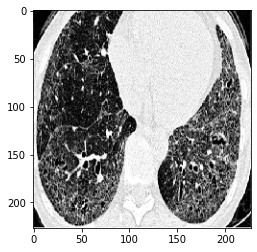

15%1.jpg COVID


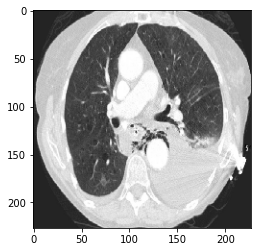

1238.png NonCOVID


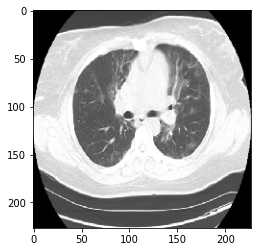

1858.png NonCOVID


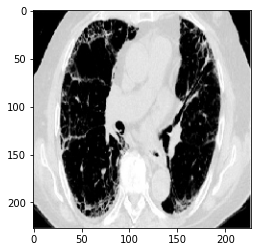

15%2.jpg COVID


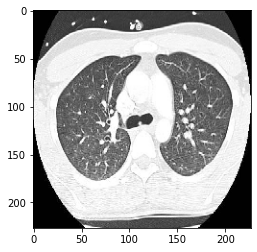

1919.png NonCOVID


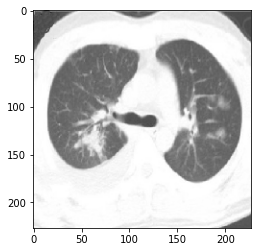

2%0.jpg COVID


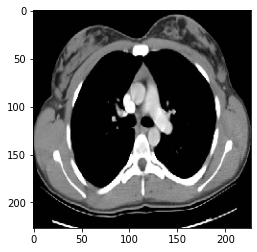

1048.png NonCOVID


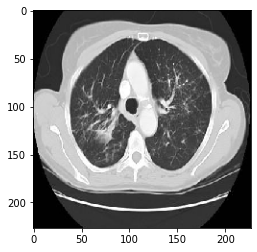

1216.png NonCOVID


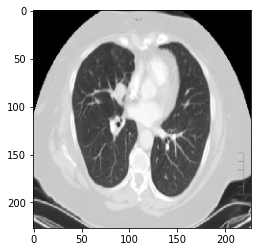

112.png NonCOVID


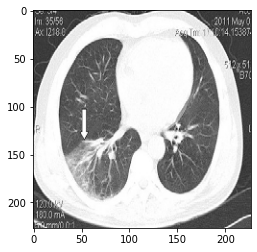

12.jpg COVID


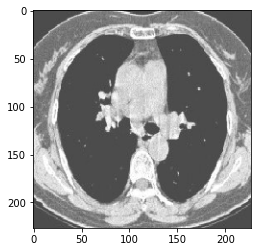

1%1.jpg NonCOVID


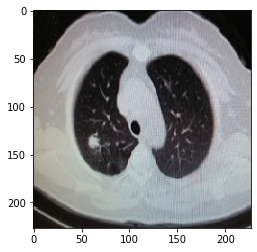

11%2.jpg COVID


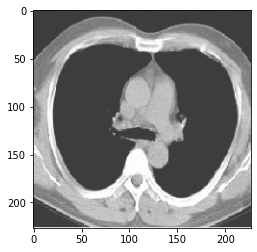

1%0.jpg NonCOVID


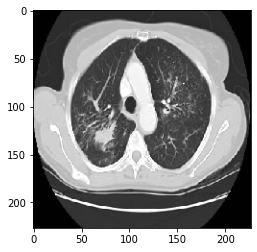

1215.png NonCOVID


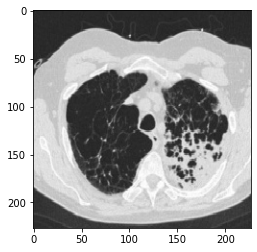

10%1.jpg NonCOVID


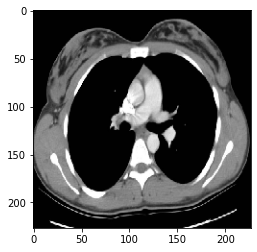

1050.png NonCOVID


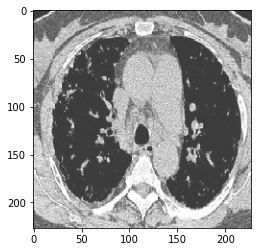

1%2.jpg NonCOVID


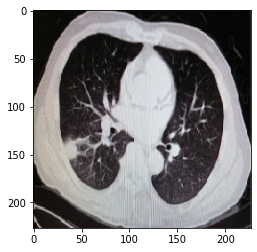

11%1.jpg COVID


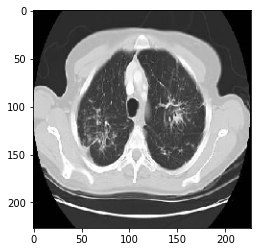

1212.png NonCOVID


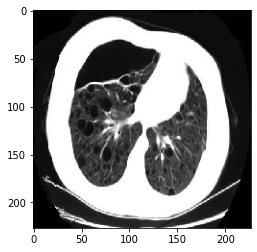

1098.png NonCOVID


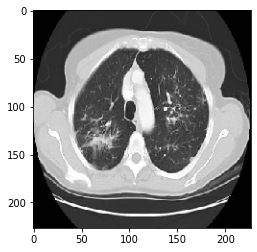

1213.png NonCOVID


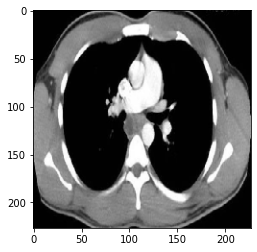

1078.png NonCOVID


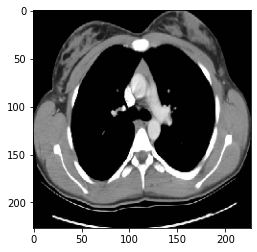

1047.png NonCOVID


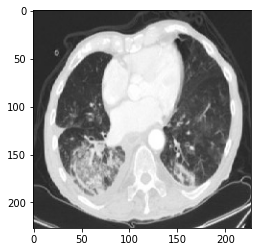

0.jpg NonCOVID


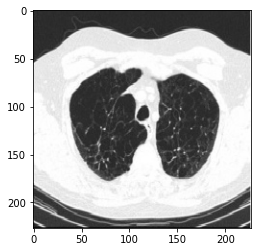

10%0.jpg NonCOVID


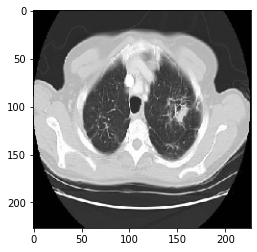

1211.png COVID


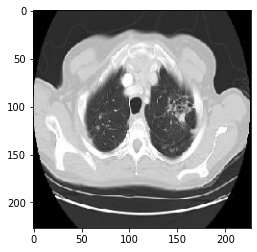

1210.png COVID


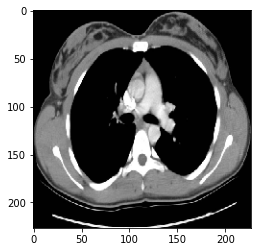

1049.png NonCOVID


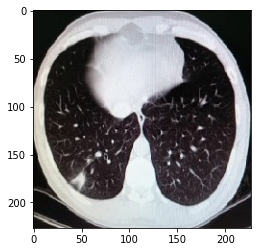

11%0.jpg NonCOVID


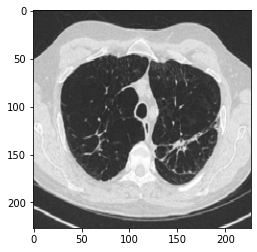

10%2.jpg NonCOVID


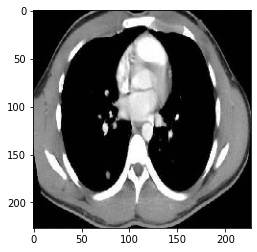

1079.png COVID


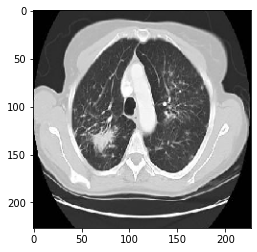

1214.png NonCOVID


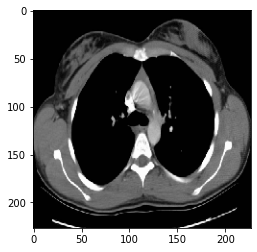

1046.png NonCOVID
total: 105
covid: 36
noncovid: 69


In [117]:
!rm -r *.png
!rm -r *.jpg
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()
total = 0
count_covid = 0
count_noncovid = 0
for fn in uploaded.keys():
  total = total + 1
  path = '/content/' + fn
  img = image.load_img(path, target_size=(227, 227))
  x = image.img_to_array(img)
  plt.imshow(x/255.)
  plt.show()
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  if (model.predict(images) > 0.5).astype("int32")[0][1]<0.5:
    print(fn + " COVID")
    count_covid = count_covid + 1
  else:
    print(fn + " NonCOVID")
    count_noncovid = count_noncovid + 1

print ('total: ' + str(total)) 
print ('covid: ' + str(count_covid))
print ('noncovid: ' + str(count_noncovid))

In [ ]:
!zip -r test.zip ./ct-images/test

Previsão COVID:

Saving 2020.03.30.20047985-p9-56%3.png to 2020.03.30.20047985-p9-56%3.png
Saving kjr-21-e24-p5-29.png to kjr-21-e24-p5-29.png
Saving kjr-21-e25-p1-12.png to kjr-21-e25-p1-12.png
Saving 2020.03.30.20047985-p9-56%1.png to 2020.03.30.20047985-p9-56%1.png
Saving 2020.03.26.20041426-p11-124.png to 2020.03.26.20041426-p11-124.png
Saving 2020.03.26.20041426-p11-122.png to 2020.03.26.20041426-p11-122.png
Saving 2020.03.30.20047985-p9-56%2.png to 2020.03.30.20047985-p9-56%2.png
Saving 2020.03.26.20041426-p11-126.png to 2020.03.26.20041426-p11-126.png
Saving 2020.03.26.20041426-p11-121.png to 2020.03.26.20041426-p11-121.png
Saving kjr-21-e25-p1-10.png to kjr-21-e25-p1-10.png
Saving 2020.03.26.20041426-p11-132.png to 2020.03.26.20041426-p11-132.png
Saving 2020.03.26.20041426-p11-120.png to 2020.03.26.20041426-p11-120.png
Saving PIIS0140673620301549_2.png to PIIS0140673620301549_2.png
Saving 2020.03.30.20047985-p9-56%0.png to 2020.03.30.20047985-p9-56%0.png
Saving 2020.03.26.20041426-p11-123.png t

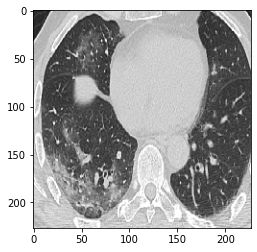

2020.03.30.20047985-p9-56%3.png COVID


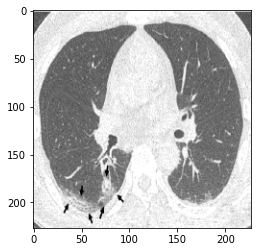

kjr-21-e24-p5-29.png NonCOVID


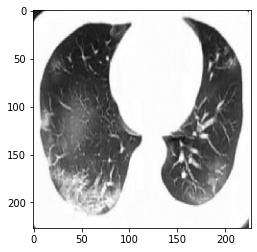

kjr-21-e25-p1-12.png COVID


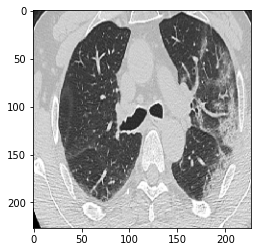

2020.03.30.20047985-p9-56%1.png COVID


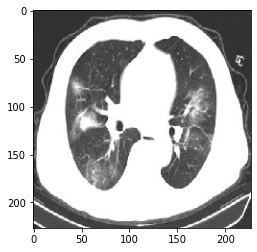

2020.03.26.20041426-p11-124.png COVID


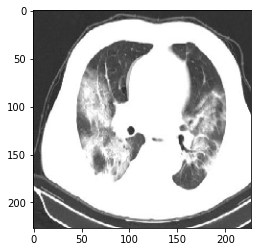

2020.03.26.20041426-p11-122.png NonCOVID


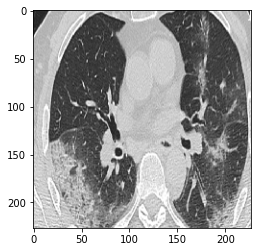

2020.03.30.20047985-p9-56%2.png COVID


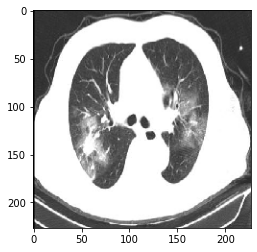

2020.03.26.20041426-p11-126.png COVID


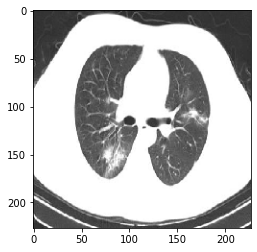

2020.03.26.20041426-p11-121.png COVID


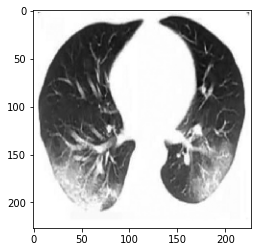

kjr-21-e25-p1-10.png COVID


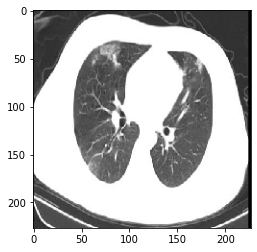

2020.03.26.20041426-p11-132.png NonCOVID


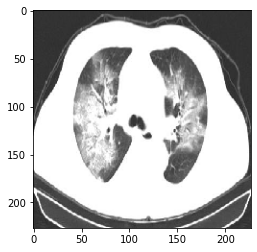

2020.03.26.20041426-p11-120.png COVID


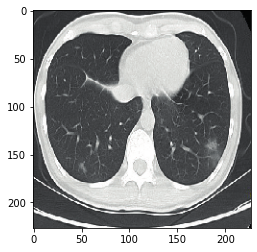

PIIS0140673620301549_2.png NonCOVID


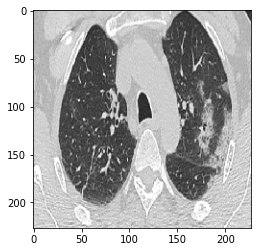

2020.03.30.20047985-p9-56%0.png COVID


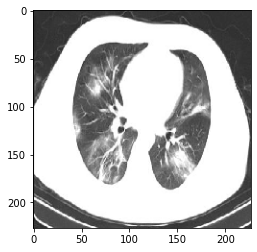

2020.03.26.20041426-p11-123.png NonCOVID


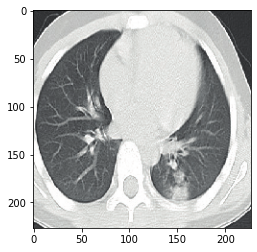

PIIS0140673620301549_1.png COVID


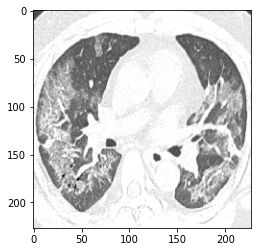

kjr-21-e24-p2-8.png COVID


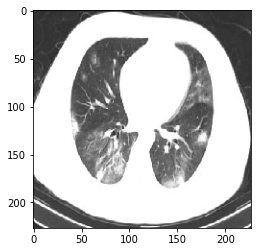

2020.03.26.20041426-p11-125.png COVID


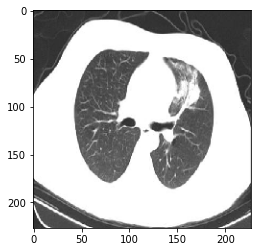

2020.03.26.20041426-p11-130.png NonCOVID


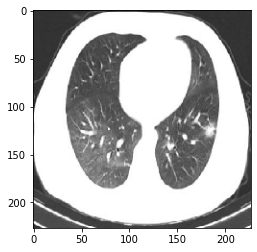

2020.03.26.20041426-p11-131.png COVID


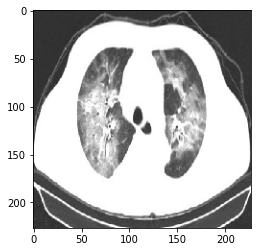

2020.03.26.20041426-p11-119.png NonCOVID


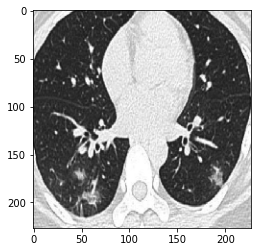

kjr-21-e25-p1-14.png COVID


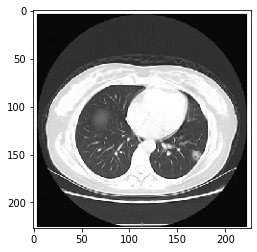

PIIS0140673620303603%8.png COVID


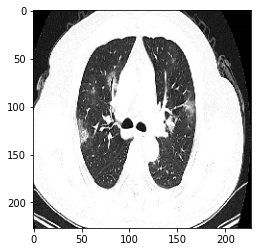

2020.03.22.20040782-p25-1542.png NonCOVID


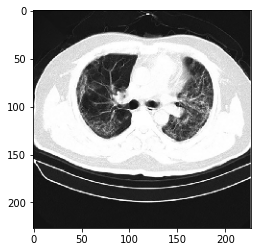

PIIS0140673620302117_1.png NonCOVID


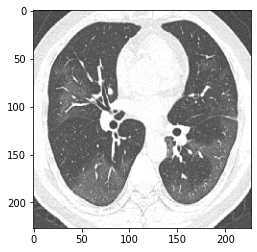

kjr-21-e24-p3-16.png NonCOVID


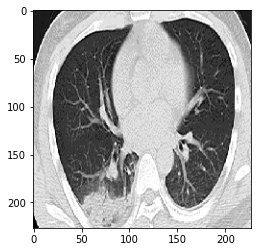

bmj.m606.full-p4-22%4.png COVID


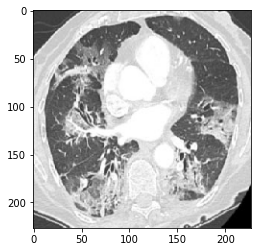

ehaa254-p0-63%3.png NonCOVID


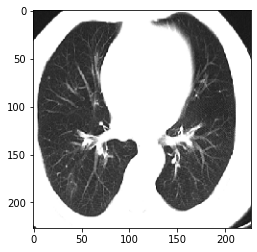

Ni2020_Article_CombinationOfWesternMedicineAn-p4-13%1.png COVID


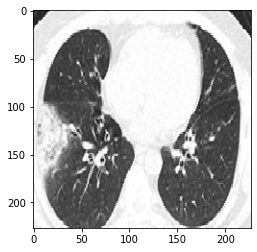

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%6.png COVID


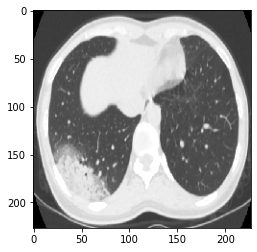

2020.03.22.20040782-p25-1543.png COVID


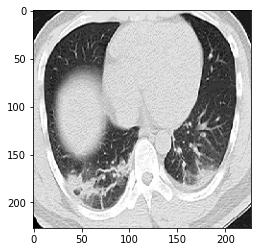

bmj.m606.full-p4-22%6.png COVID


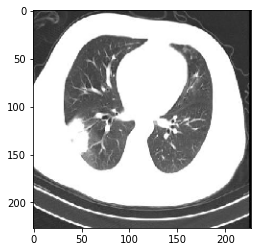

2020.03.26.20041426-p11-133.png COVID


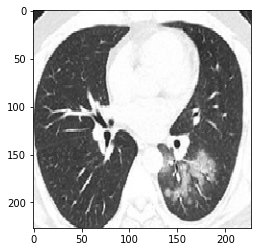

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%10.png COVID


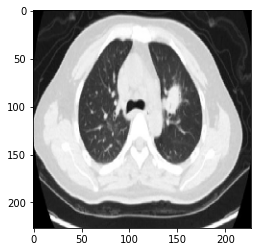

Talaromyces-marneffei-infection-relapse-presenting-as-ost_2020_International-p1-12%1.png NonCOVID


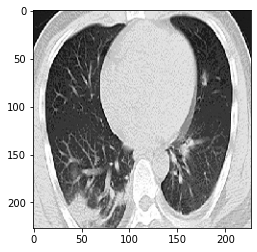

bmj.m606.full-p4-22%5.png COVID


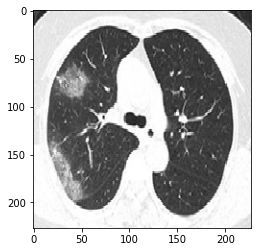

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%5.png COVID


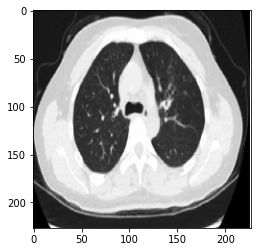

Talaromyces-marneffei-infection-relapse-presenting-as-ost_2020_International-p1-12%3.png NonCOVID


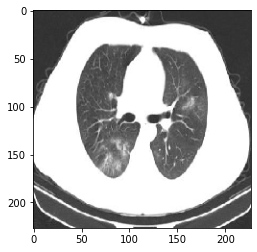

2020.03.26.20041426-p11-127.png NonCOVID


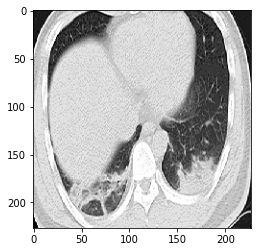

bmj.m606.full-p4-22%7.png COVID


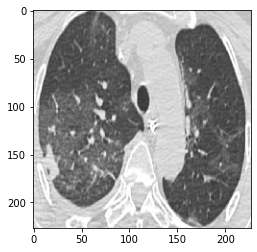

2019-novel-Coronavirus-severe-adult-respiratory-dist_2020_International-Jour-p3-91.png COVID


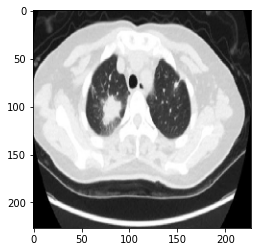

Talaromyces-marneffei-infection-relapse-presenting-as-ost_2020_International-p1-12%0.png NonCOVID


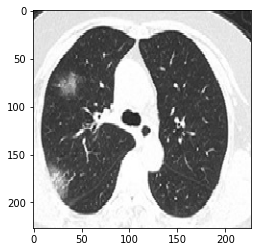

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%4.png COVID


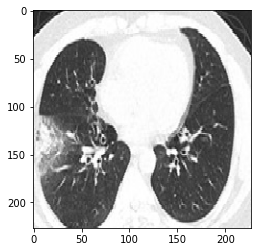

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%7.png COVID


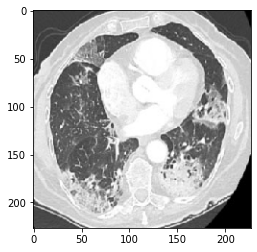

ehaa254-p0-63%2.png COVID


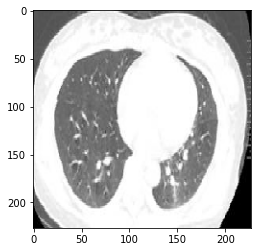

impact_of_covid19_infection_on_pregnancy_outcomes_and_the_risk_of_maternaltoneonatal_intrapartum_transmission_of_covid19_during_natural_birth-p8-41%5.png COVID


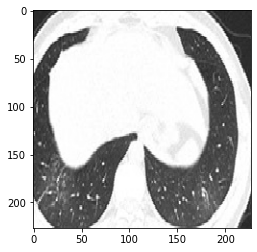

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%3.png NonCOVID


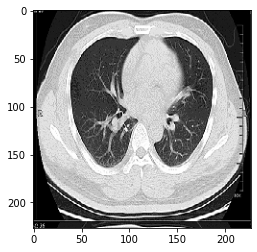

bmj.m606.full-p4-22%0.png COVID


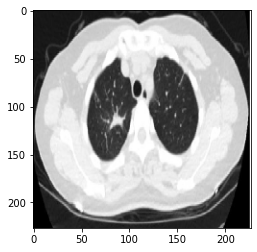

Talaromyces-marneffei-infection-relapse-presenting-as-ost_2020_International-p1-12%2.png NonCOVID


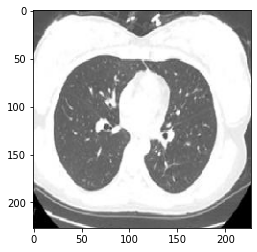

impact_of_covid19_infection_on_pregnancy_outcomes_and_the_risk_of_maternaltoneonatal_intrapartum_transmission_of_covid19_during_natural_birth-p8-41%3.png NonCOVID


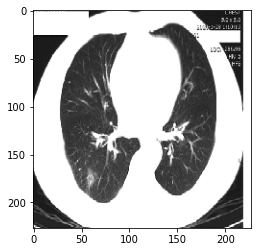

Ni2020_Article_CombinationOfWesternMedicineAn-p4-13%0.png COVID


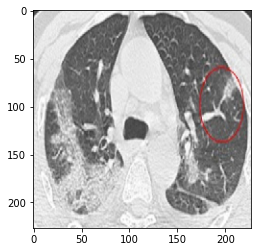

2019-novel-Coronavirus-severe-adult-respiratory-dist_2020_International-Jour-p3-89%1.png COVID


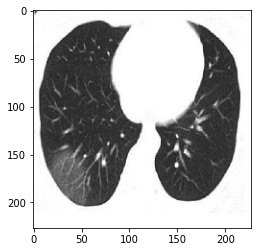

kjr-21-e25-p1-6.png COVID


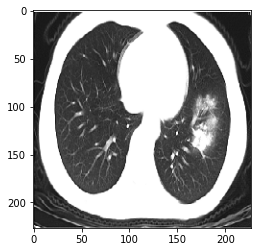

Ni2020_Article_CombinationOfWesternMedicineAn-p3-10%0.png COVID


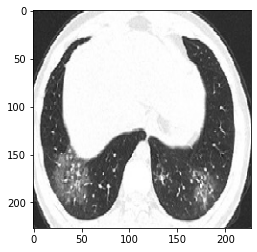

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%2.png NonCOVID


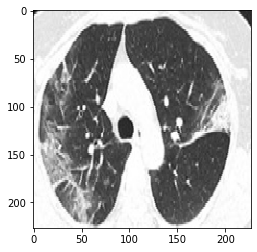

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%1.png COVID


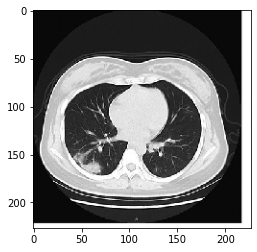

PIIS0140673620303603%1.png COVID


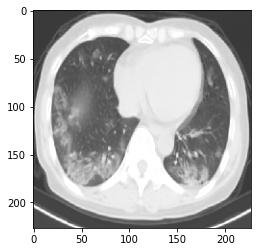

2020.03.22.20040782-p25-1545.png NonCOVID


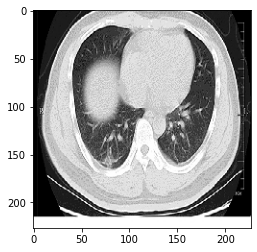

bmj.m606.full-p4-22%2.png COVID


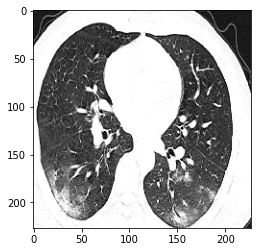

2020.03.22.20040782-p25-1546.png COVID


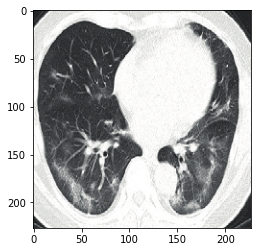

PIIS0140673620301549_0%0.png COVID


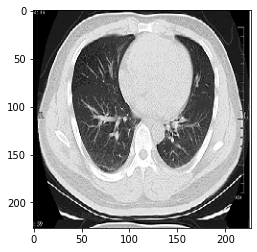

bmj.m606.full-p4-22%1.png COVID


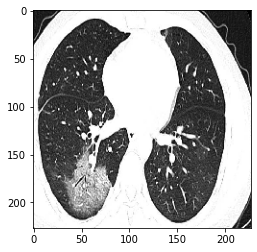

2020.03.22.20040782-p25-1544.png COVID


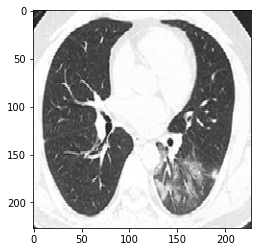

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%11.png COVID


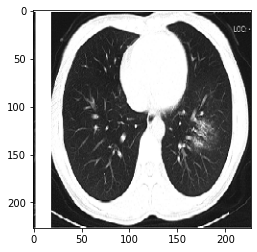

Ni2020_Article_CombinationOfWesternMedicineAn-p3-10%1.png COVID


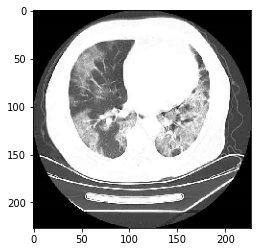

2020.03.25.20037721-p27-173.png NonCOVID


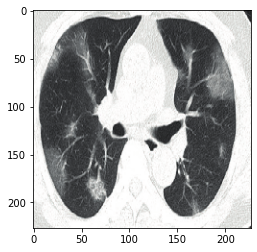

PIIS0140673620301549_0%1.png COVID


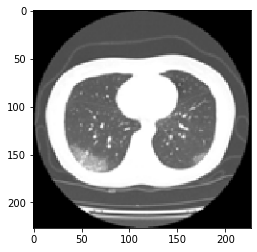

2020.03.25.20043166-p17-80.png NonCOVID


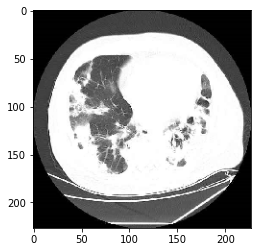

2020.03.25.20037721-p27-172.png NonCOVID


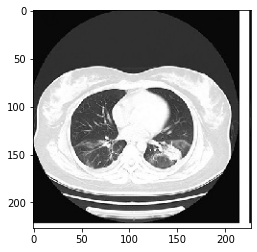

PIIS0140673620303603%0.png NonCOVID


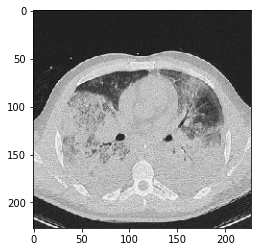

med-9780198814924-chapter-17-p10-515.png COVID


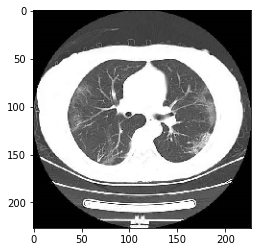

2020.03.25.20037721-p27-182.png NonCOVID


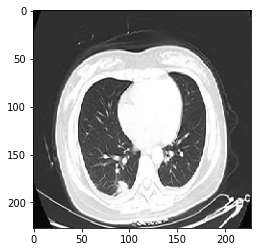

PIIS0140673620303603%5.png COVID


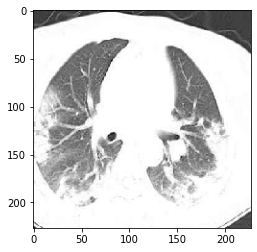

2020.03.25.20037721-p27-165.png COVID


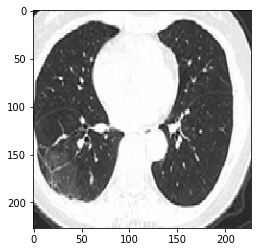

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%9.png COVID


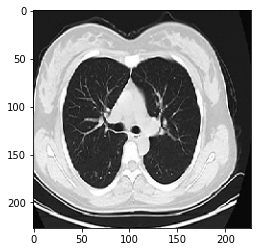

PIIS0140673620303603%6.png NonCOVID


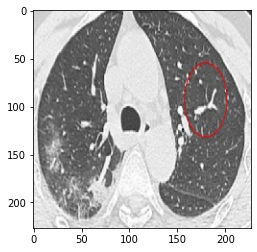

2019-novel-Coronavirus-severe-adult-respiratory-dist_2020_International-Jour-p3-89%0.png COVID


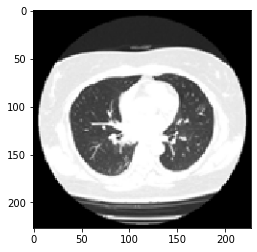

2020.03.25.20043166-p17-78.png NonCOVID


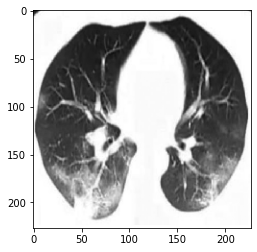

kjr-21-e25-p1-8.png COVID


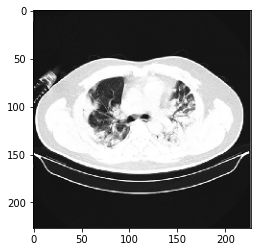

PIIS0140673620302117_2.png COVID


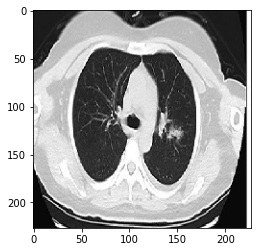

PIIS0140673620303603%3.png NonCOVID


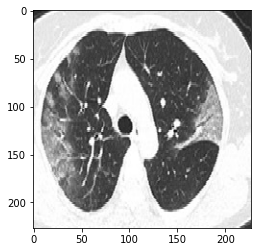

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%0.png COVID


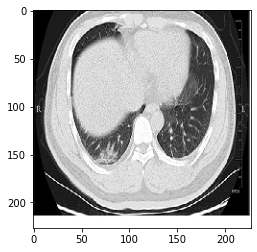

bmj.m606.full-p4-22%3.png COVID


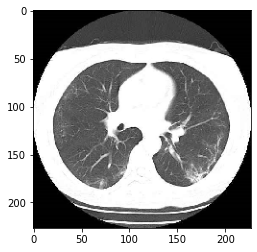

2020.03.25.20037721-p27-181.png NonCOVID


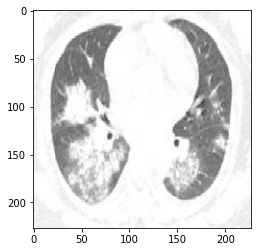

impact_of_covid19_infection_on_pregnancy_outcomes_and_the_risk_of_maternaltoneonatal_intrapartum_transmission_of_covid19_during_natural_birth-p8-41%1.png COVID


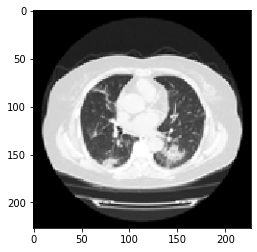

2020.03.25.20043166-p17-79.png NonCOVID


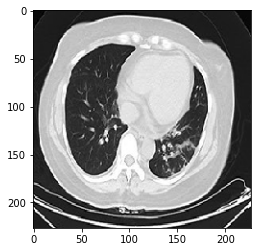

PIIS0140673620303603%2.png NonCOVID


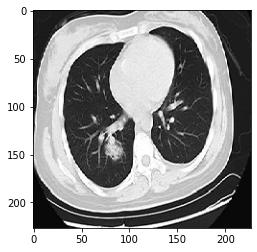

PIIS0140673620303603%7.png COVID


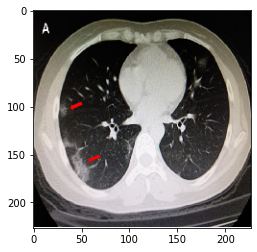

Recurrence-of-positive-SARS-CoV-2-RNA-in-C_2020_International-Journal-of-Inf-p1-21%0.png COVID


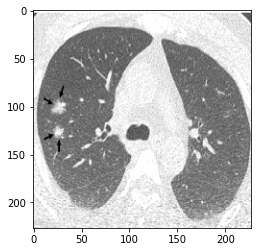

kjr-21-e24-p5-31.png NonCOVID


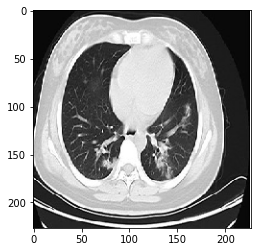

PIIS0140673620303603%4.png COVID


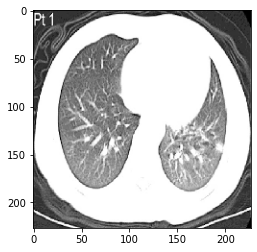

2020.03.12.20034686-p17-91-1.png COVID


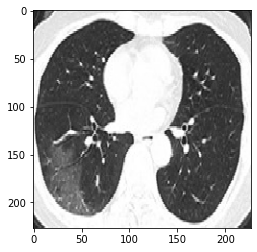

Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%8.png COVID


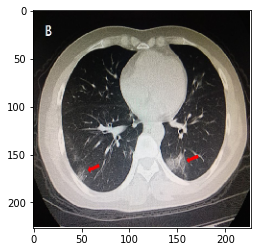

Recurrence-of-positive-SARS-CoV-2-RNA-in-C_2020_International-Journal-of-Inf-p1-21%1.png COVID


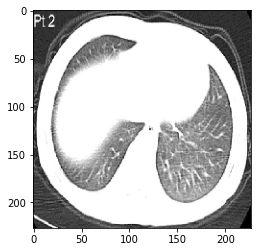

2020.03.12.20034686-p17-91-2.png NonCOVID


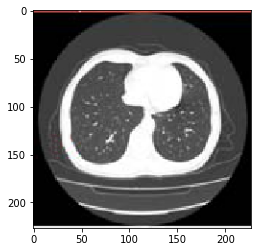

2020.03.25.20043166-p17-81.png COVID


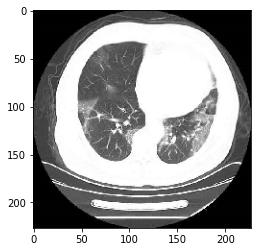

2020.03.25.20037721-p27-174.png NonCOVID


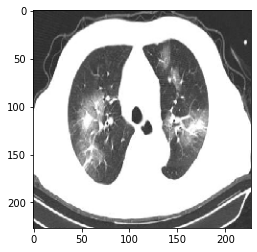

2020.03.26.20041426-p11-128.png COVID
total: 98
covid: 64
noncovid: 34


In [118]:
!rm -r *.png
!rm -r *.jpg
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()
total = 0
count_covid = 0
count_noncovid = 0
for fn in uploaded.keys():
  total = total + 1
  path = '/content/' + fn
  img = image.load_img(path, target_size=(227, 227))
  x = image.img_to_array(img)
  plt.imshow(x/255.)
  plt.show()
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  if (model.predict(images) > 0.5).astype("int32")[0][1]<0.5:
    print(fn + " COVID")
    count_covid = count_covid + 1
  else:
    print(fn + " NonCOVID")
    count_noncovid = count_noncovid + 1

print ('total: ' + str(total)) 
print ('covid: ' + str(count_covid))
print ('noncovid: ' + str(count_noncovid))